## 🌌 TDE FINK Pipeline
Transient Detection & Pre-burst Analysis


Author: Phelipe Darc (CBPF & Northwestern University) | Date: 12/02/2026


Dataset: MALLORN Data challenge | Status: Preprocessing

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import numpy as np
import pandas as pd
from extinction import fitzpatrick99
from scipy.optimize import least_squares
#Defining function to de-extinct a set of flux values
def jurassic_park (flux, eff_wl):
    A_lambda = fitzpatrick99(eff_wl, ebv * 3.1) #3.1 = Standard Milky Way value
    flux_ext = flux * 10**((A_lambda)/2.5)
    return flux_ext, A_lambda

# Effective wavelengths in Å (Rubin / LSST standard)
EFF_WL = {
    "u": 3641,
    "g": 4704,
    "r": 6155,
    "i": 7504,
    "z": 8695,
    "y": 10056,
}
AB_ZP_uJy = 23.9  # AB zero point for flux in microjansky

def load_mallorn_preprocess_FINK(log_csv_path):
    """
    Load MALLORN dataset, de-extinct fluxes, and convert µJy → AB magnitudes.
    """

    base_dir = os.path.dirname(log_csv_path)
    log_df = pd.read_csv(log_csv_path)

    split_csvs = sorted(
        glob.glob(os.path.join(base_dir, "split_*", "*_full_lightcurves.csv"))
    )

    split_dfs = [pd.read_csv(csv) for csv in split_csvs]

    results = []
    # Ensure 'target' column exists
    if 'target' not in log_df.columns:
        log_df['target'] = 0

    for _, row in log_df.iterrows():
        object_id = row["object_id"]
        target = row['target']
        ebv = row["EBV"]
        redshift = row["Z"]
        spectype = row["SpecType"] if "SpecType" in log_df.columns else np.nan

        lc_df = None
        for df in split_dfs:
            sub = df[df["object_id"] == object_id]
            if not sub.empty:
                lc_df = sub.copy()
                break

        if lc_df is None:
            continue

        lc_df = lc_df.rename(columns={
            "Time (MJD)": "mjd",
            "Flux": "flux",
            "Flux_err": "flux_err",
            "Filter": "filter"
        })

        # Extinction per observation
        A_lambda = np.array([
            fitzpatrick99(
                np.array([EFF_WL[f]]),
                ebv * 3.1
            )[0]
            for f in lc_df["filter"]
        ])

        # De-extinct fluxes (still in µJy)
        lc_df["flux_dered"] = lc_df["flux"] * 10 ** (A_lambda / 2.5)
        lc_df["flux_err_dered"] = lc_df["flux_err"] * 10 ** (A_lambda / 2.5)

        lc_df['SNR'] = lc_df['flux']/lc_df["flux_err"] 
        
        #Time set to start in zero:
        lc_df['time_t0'] = lc_df['mjd']-lc_df['mjd'].min()
        
        mask_5SNR = lc_df['SNR']>5.0
        mask_3SNR = lc_df['SNR']>3.0

        lc_df['detection_5SNR'] = mask_5SNR
        lc_df['detection_3SNR'] = mask_3SNR


        lightcurve = lc_df[
            ["mjd", 'time_t0', "filter",'flux','flux_err','SNR','flux_dered',"flux_err_dered",'detection_5SNR','detection_3SNR']
        ].sort_values("mjd").reset_index(drop=True)

        results.append({
            "object_id": object_id,
            "redshift": redshift,
            "ebv": ebv,
            "SpecType": spectype,
            "target":target,
            "lightcurve": lightcurve
        })

    return pd.DataFrame(results)


The file 

In [18]:
df = load_mallorn_preprocess_FINK("/tf/astrodados2/TDE_Data/mallorn_data/train_log.csv")

In [20]:
df.loc[0, "lightcurve"]

,mjd,time_t0,filter,flux,flux_err,SNR,flux_dered,flux_err_dered,detection_5SNR,detection_3SNR
0,63314.4662,0.0000,z,-1.630159,0.365777,-4.456698,-1.895577,0.425332,False,False
1,63314.4662,0.0000,y,-1.424537,1.059526,-1.344504,-1.601701,1.191295,False,False
2,63327.6691,13.2029,i,-1.409011,0.321132,-4.387638,-1.709406,0.389596,False,False
3,63327.6691,13.2029,z,-1.558067,0.397569,-3.918987,-1.811747,0.462300,False,False
4,63340.8720,26.4058,i,-2.057437,0.332684,-6.184360,-2.496073,0.403611,False,False
...,...,...,...,...,...,...,...,...,...,...
60,64529.1295,1214.6633,y,0.077921,1.098580,0.070929,0.087612,1.235206,False,False
61,64555.5353,1241.0691,z,-0.259298,0.846390,-0.306357,-0.301516,0.984197,False,False
62,64555.5353,1241.0691,y,-2.412525,2.894828,-0.833391,-2.712560,3.254845,False,False
63,64568.7381,1254.2719,u,0.000435,0.347096,0.001254,0.000704,0.561537,False,False


#### Do we have any object with less than 5 detections? -- Answer: No

In [29]:
for idx, row in df.iterrows():
    df.loc[idx,'SpecType']
    lc = row["lightcurve"]
    
    # Get counts of True/False
    counts = lc['detection_5SNR'].value_counts()
    
    # Safely get the count of True (defaults to 0 if not found)
    true_count = counts.get(True, 0)
    
    print(f"Object Index {idx}: {true_count} detections")
    
    if true_count < 5:
        print(f"Fix this code: Object {row['object_id']} has only {true_count} detections.")

Object Index 0: 13 detections
Object Index 1: 11 detections
Object Index 2: 20 detections
Object Index 3: 82 detections
Object Index 4: 18 detections
Object Index 5: 36 detections
Object Index 6: 10 detections
Object Index 7: 59 detections
Object Index 8: 14 detections
Object Index 9: 12 detections
Object Index 10: 26 detections
Object Index 11: 12 detections
Object Index 12: 22 detections
Object Index 13: 11 detections
Object Index 14: 18 detections
Object Index 15: 13 detections
Object Index 16: 39 detections
Object Index 17: 32 detections
Object Index 18: 14 detections
Object Index 19: 10 detections
Object Index 20: 11 detections
Object Index 21: 51 detections
Object Index 22: 55 detections
Object Index 23: 10 detections
Object Index 24: 56 detections
Object Index 25: 15 detections
Object Index 26: 12 detections
Object Index 27: 10 detections
Object Index 28: 8 detections
Object Index 29: 71 detections
Object Index 30: 13 detections
Object Index 31: 12 detections
Object Index 32: 10

#### Number of Detections per Class

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated a

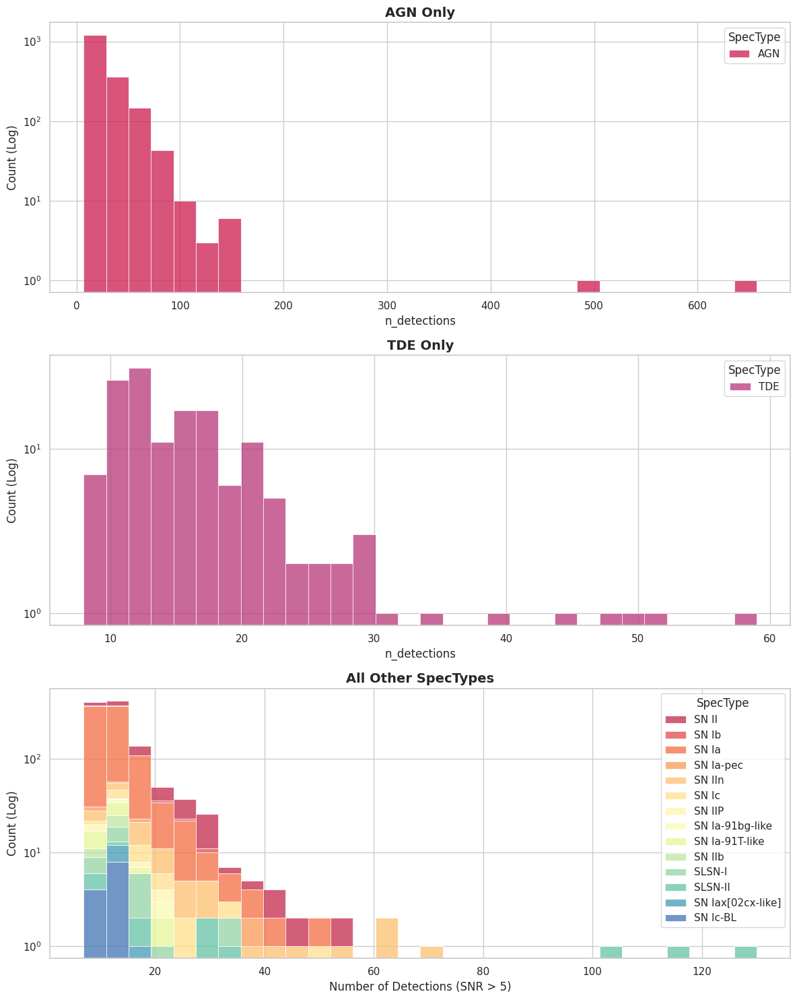

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

df_agn = df[df['SpecType'] == 'AGN']
df_tde = df[df['SpecType'] == 'TDE']
df_others = df[~df['SpecType'].isin(['AGN', 'TDE'])]

groups = [
    ("AGN Only", df_agn, "rocket"),    
    ("TDE Only", df_tde, "magma"),     
    ("All Other SpecTypes", df_others, "Spectral") 
]

fig, axes = plt.subplots(3, 1, figsize=(12, 15), sharex=False)

for i, (title, sub_df, pal) in enumerate(groups):
    if sub_df.empty:
        axes[i].text(0.5, 0.5, f"No data for {title}", ha='center')
        continue
        
    sns.histplot(
        data=sub_df, 
        x='n_detections', 
        hue='SpecType', 
        multiple="stack", 
        bins=30, 
        log_scale=(False, True),
        palette=pal,
        edgecolor="white",
        linewidth=0.5,
        ax=axes[i]
    )
    
    axes[i].set_title(title, fontsize=14, fontweight='bold')
    axes[i].set_ylabel('Count (Log)')


plt.xlabel('Number of Detections (SNR > 5)', fontsize=12)
plt.tight_layout()
plt.show()

In [39]:
# Save
df.to_pickle('mallorn_data_fink_SNR_Full_LCs.pkl')

# Load
df2 = pd.read_pickle('mallorn_data_fink_SNR_Full_LCs.pkl')

In [40]:
df2

,object_id,redshift,ebv,SpecType,target,lightcurve,n_detections
0,Dornhoth_fervain_onodrim,3.0490,0.110,AGN,0,mjd time_t0 filter flux fl...,13
1,Dornhoth_galadh_ylf,0.4324,0.058,SN II,0,mjd time_t0 filter flux f...,11
2,Elrim_melethril_thul,0.4673,0.577,AGN,0,mjd time_t0 filter flux fl...,20
3,Ithil_tobas_rodwen,0.6946,0.012,AGN,0,mjd time_t0 filter flux f...,82
4,Mirion_adar_Druadan,0.4161,0.058,AGN,0,mjd time_t0 filter flux f...,18
...,...,...,...,...,...,...,...
3038,tinnu_gellui_tathar,0.8898,0.042,AGN,0,mjd time_t0 filter flux f...,13
3039,uir_heleg_corf,0.9598,0.042,AGN,0,mjd time_t0 filter flux f...,25
3040,uir_rhosc_law,0.1543,0.024,SN II,0,mjd time_t0 filter flux f...,17
3041,uruk_in_pess,1.1520,0.019,AGN,0,mjd time_t0 filter flux f...,26


##### Sanity Check 

In [41]:
df.loc[0, "lightcurve"].head()

,mjd,time_t0,filter,flux,flux_err,SNR,flux_dered,flux_err_dered,detection_5SNR,detection_3SNR
0,63314.4662,0.0000,z,-1.630159,0.365777,-4.456698,-1.895577,0.425332,False,False
1,63314.4662,0.0000,y,-1.424537,1.059526,-1.344504,-1.601701,1.191295,False,False
2,63327.6691,13.2029,i,-1.409011,0.321132,-4.387638,-1.709406,0.389596,False,False
3,63327.6691,13.2029,z,-1.558067,0.397569,-3.918987,-1.811747,0.462300,False,False
4,63340.8720,26.4058,i,-2.057437,0.332684,-6.184360,-2.496073,0.403611,False,False


In [42]:
df2.loc[0, "lightcurve"].head()

,mjd,time_t0,filter,flux,flux_err,SNR,flux_dered,flux_err_dered,detection_5SNR,detection_3SNR
0,63314.4662,0.0000,z,-1.630159,0.365777,-4.456698,-1.895577,0.425332,False,False
1,63314.4662,0.0000,y,-1.424537,1.059526,-1.344504,-1.601701,1.191295,False,False
2,63327.6691,13.2029,i,-1.409011,0.321132,-4.387638,-1.709406,0.389596,False,False
3,63327.6691,13.2029,z,-1.558067,0.397569,-3.918987,-1.811747,0.462300,False,False
4,63340.8720,26.4058,i,-2.057437,0.332684,-6.184360,-2.496073,0.403611,False,False


## Preprocessing MALLORN Dataset [FINK]

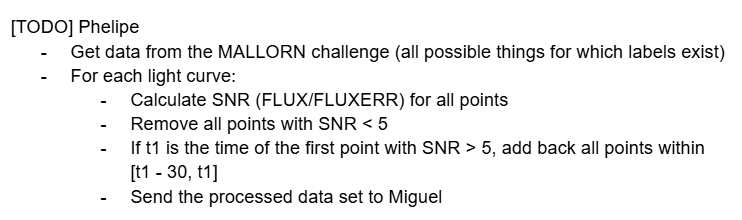

In [43]:
df2

,object_id,redshift,ebv,SpecType,target,lightcurve,n_detections
0,Dornhoth_fervain_onodrim,3.0490,0.110,AGN,0,mjd time_t0 filter flux fl...,13
1,Dornhoth_galadh_ylf,0.4324,0.058,SN II,0,mjd time_t0 filter flux f...,11
2,Elrim_melethril_thul,0.4673,0.577,AGN,0,mjd time_t0 filter flux fl...,20
3,Ithil_tobas_rodwen,0.6946,0.012,AGN,0,mjd time_t0 filter flux f...,82
4,Mirion_adar_Druadan,0.4161,0.058,AGN,0,mjd time_t0 filter flux f...,18
...,...,...,...,...,...,...,...
3038,tinnu_gellui_tathar,0.8898,0.042,AGN,0,mjd time_t0 filter flux f...,13
3039,uir_heleg_corf,0.9598,0.042,AGN,0,mjd time_t0 filter flux f...,25
3040,uir_rhosc_law,0.1543,0.024,SN II,0,mjd time_t0 filter flux f...,17
3041,uruk_in_pess,1.1520,0.019,AGN,0,mjd time_t0 filter flux f...,26


In [44]:
df2.loc[10, "lightcurve"].head()

,mjd,time_t0,filter,flux,flux_err,SNR,flux_dered,flux_err_dered,detection_5SNR,detection_3SNR
0,60981.5563,0.0000,r,-0.599352,0.268553,-2.231783,-0.612370,0.274386,False,False
1,60981.5563,0.0000,g,-0.865138,0.272288,-3.177292,-0.892616,0.280936,False,False
2,60990.0434,8.4871,z,-0.768358,0.267482,-2.872564,-0.777900,0.270803,False,False
3,60990.0434,8.4871,i,-0.417983,0.281602,-1.484302,-0.424645,0.286091,False,False
4,61159.7842,178.2279,y,1.706007,1.278756,1.334114,1.722447,1.291079,False,False


In [51]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_validation(idx, df2):
    # 1. Extract data
    full_lc = df2.loc[idx, 'lightcurve']
    pre_burst = df2.loc[idx, 'lightcurve_preprocessed_30d']
    obj_id = df2.loc[idx, 'object_id']
    spec_type = df2.loc[idx, 'SpecType']

    # Create the figure
    plt.figure(figsize=(12, 6))
    
    # 2. Plot Full Light Curve (Background)
    sns.scatterplot(
        data=full_lc, x='mjd', y='flux', hue='filter', 
        marker='^', alpha=0.3, s=60, label='Full LC'
    )


    if pre_burst is not None and not pre_burst.empty:
        sns.scatterplot(
            data=pre_burst, x='mjd', y='flux', hue='filter', 
            marker='o', alpha=1.0, s=80, edgecolor='black', legend=False
        )
        
        # 4. Mark t0 (The start of the rise)
        # t0 is the max MJD in your pre-burst window based on your logic [t0-30, t0]
        t0 = pre_burst['mjd'].max()
        plt.axvline(x=t0, color='red', linestyle='--', alpha=0.8, label=f't0 (Start): {t0:.2f}')
        
        plt.axvspan(t0 - 30, t0, color='gray', alpha=0.1, label='30d Window')

    plt.title(f"Validation: Object {obj_id} ({spec_type})", fontsize=14)
    plt.xlabel("Time (MJD)")
    plt.ylabel("Flux (µJy)")
    plt.grid(True, which='both', linestyle=':', alpha=0.5)
    
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc='best')
    
    plt.show()


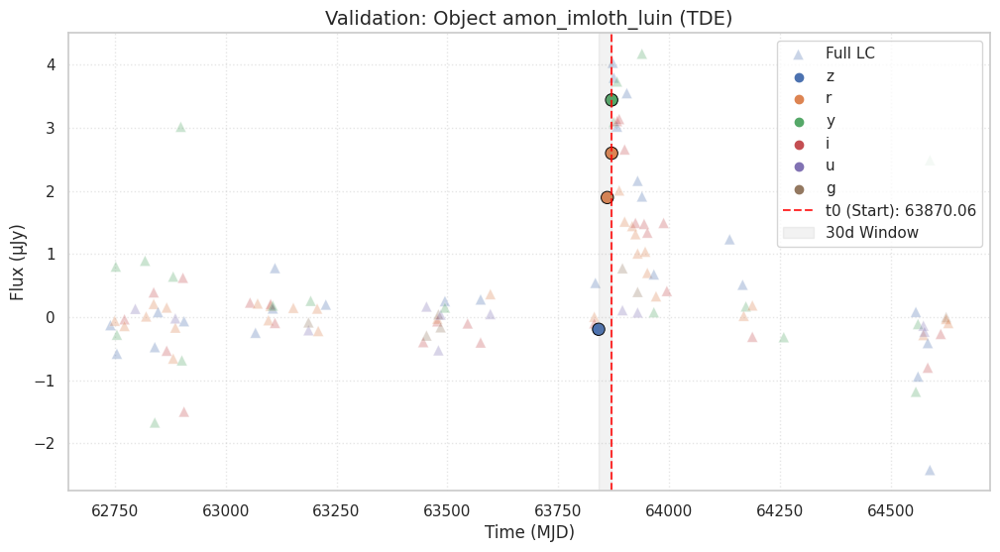

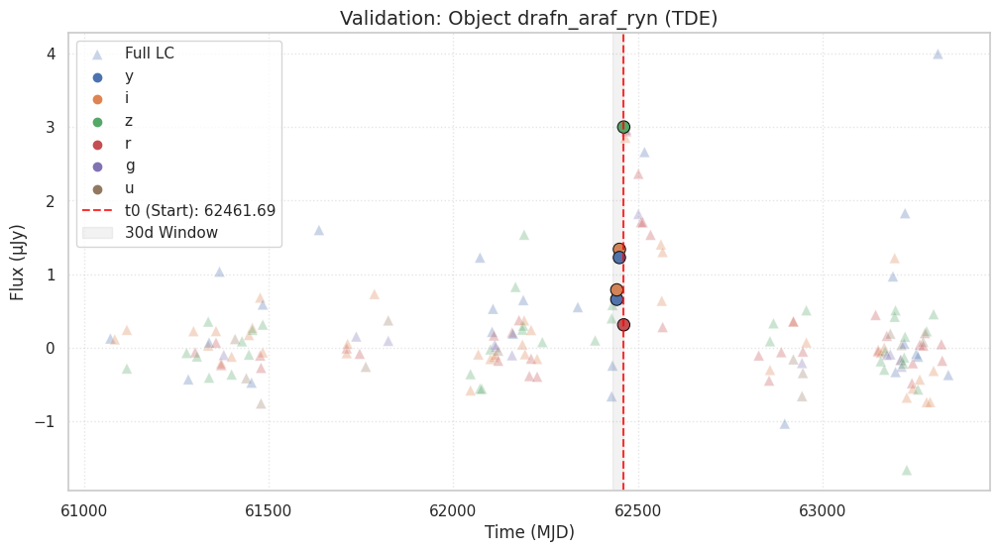

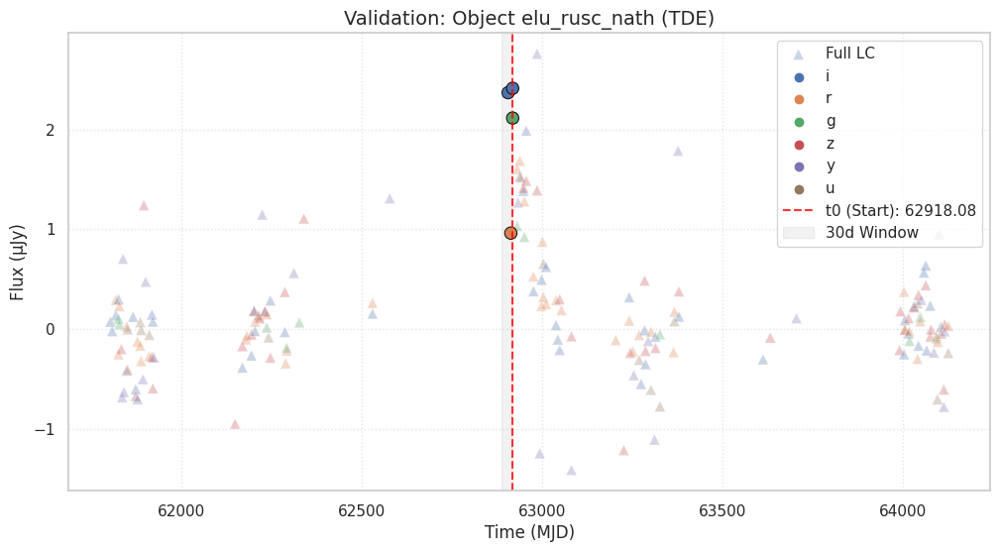

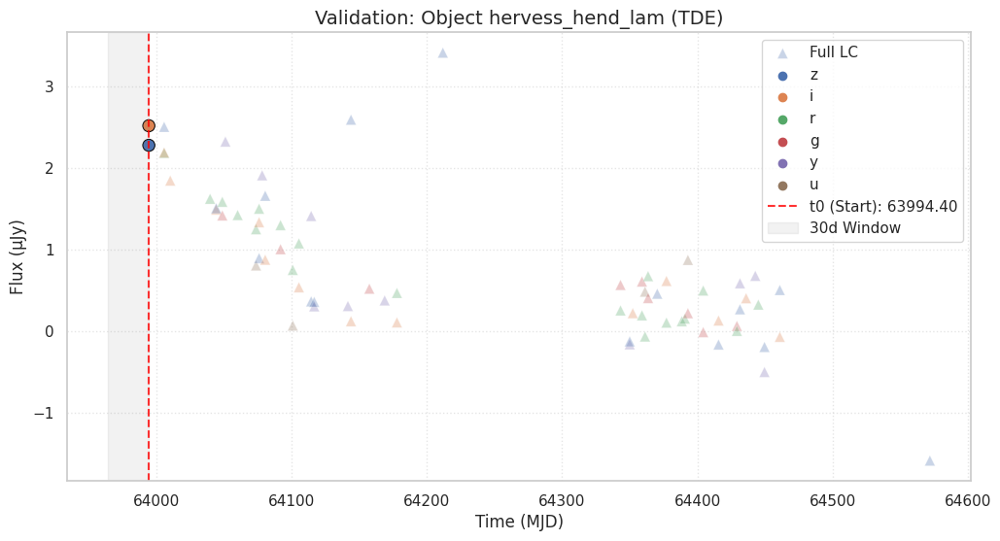

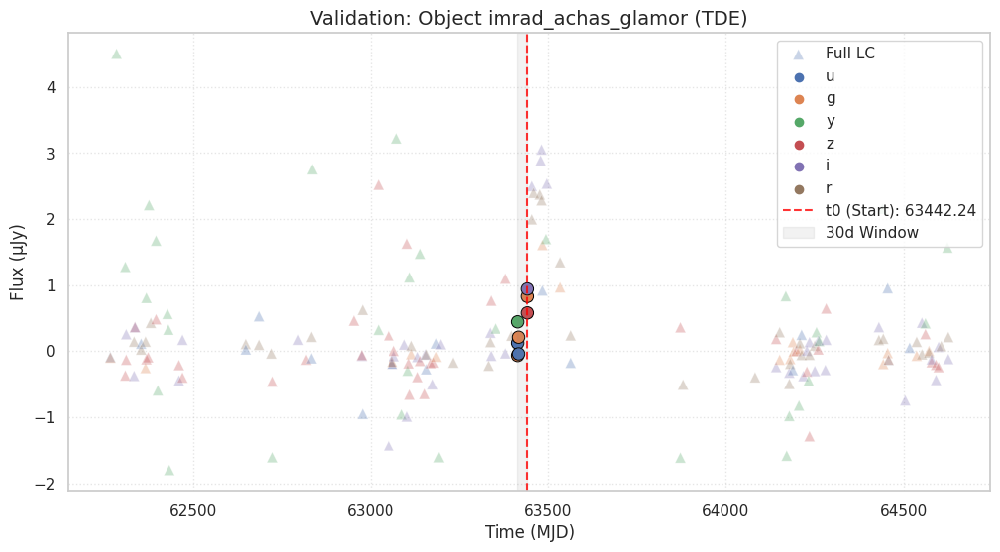

...

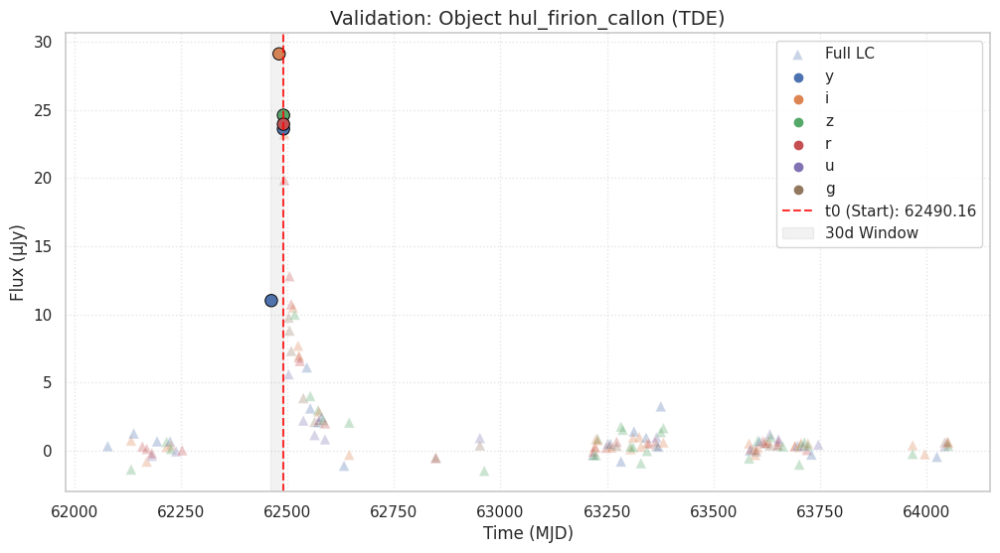

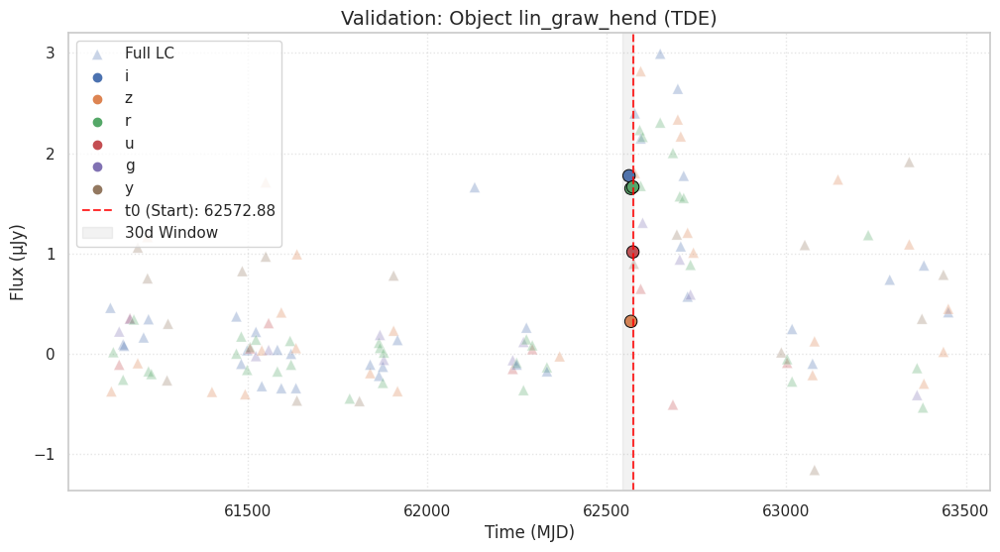

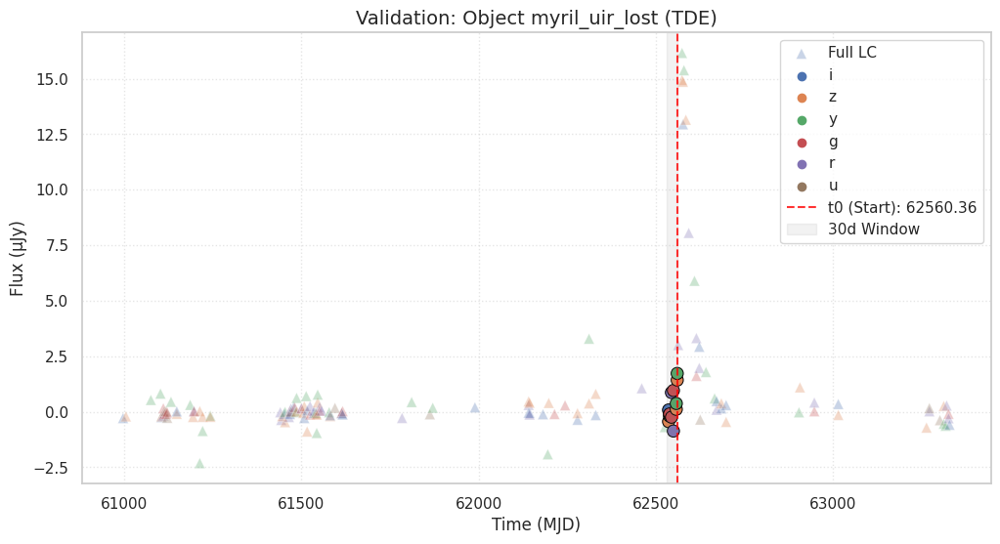

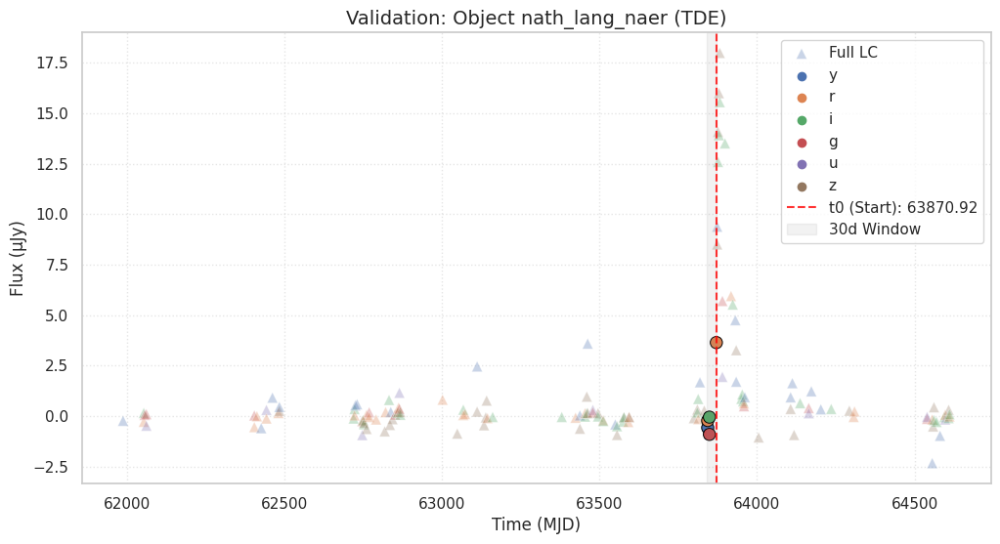

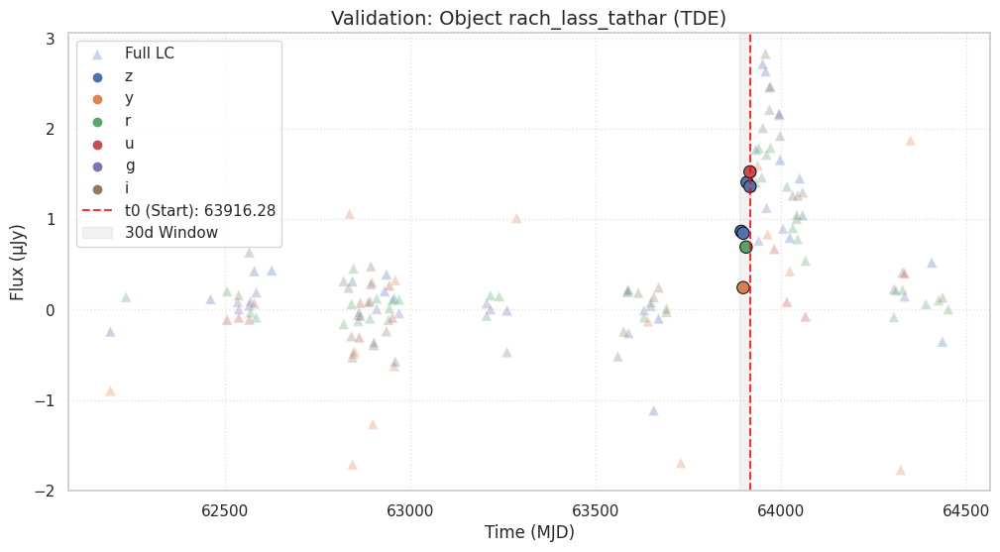

In [57]:
df2['lightcurve_preprocessed_30d'] = None

for idx, row in df2.iterrows():

    spec_type =  df2.loc[idx, 'SpecType']
    lc = row["lightcurve"].sort_values("mjd")
    
    # Filter for only detections with SNR > 5
    detections = lc[lc['detection_5SNR'] == True]
    

    found_start = False
    t_start = None

    # Iterate through detections to find the first pair < 5 days apart (this can be changed in the future)
    #This criteria was made to ensure we are grabbing the rise of the transient instead of a random good detection
    for i in range(len(detections) - 1):
        t_current = detections.iloc[i]['mjd']
        t_next = detections.iloc[i+1]['mjd']
        
        if (t_next - t_current) < 5:
            # The "first" detection of this valid pair is our t0
            t0 = t_current
            found_start = True
            break
            
    if found_start:
        # Grab all data (even SNR < 5 - Non-detections) between [t0 - 30, t0]
        
        pre_burst_data = lc[(lc['mjd'] >= (t0 - 30)) & (lc['mjd'] <= t0)].copy()
        
        # Save to the new column
        df2.at[idx, 'lightcurve_preprocessed_30d'] = pre_burst_data

        if spec_type=='TDE':
            plot_validation(idx, df2)
        
      

In [60]:
# Returns rows where the preprocessed lightcurve is missing and therefore does not meet the criteria 
#-- We see that only AGNs fails this criteria, given the number of AGNs in our data, I guess its okay to remove them.
failed_logic_df = df2[df2['lightcurve_preprocessed_30d'].isna()]

print(f"Number of objects that failed the 5-day criteria: {len(failed_logic_df)}")
display(failed_logic_df)

Number of objects that failed the 5-day criteria: 22


,object_id,redshift,ebv,SpecType,target,lightcurve,n_detections,lightcurve_preprocessed_30d
105,paich_Mirion_aeruil,1.3570,0.009,AGN,0,mjd time_t0 filter flux f...,13,None
333,adab_Gonhir_gwanur,1.8050,0.048,AGN,0,mjd time_t0 filter flux f...,10,None
342,amath_celon_agarwaen,1.3930,0.058,AGN,0,mjd time_t0 filter flux f...,8,None
352,bain_gobennas_minas,0.9152,0.025,AGN,0,mjd time_t0 filter flux f...,11,None
475,agor_araf_faradrim,1.5140,0.022,AGN,0,mjd time_t0 filter flux fl...,11,None
478,angos_celon_lain,0.7692,0.087,AGN,0,mjd time_t0 filter flux f...,11,None
549,lost_ulug_aeglir,1.5850,0.019,AGN,0,mjd time_t0 filter flux f...,8,None
687,hal_andrann_perian,1.3040,0.046,AGN,0,mjd time_t0 filter flux f...,10,None
806,cair_gwael_lorn,0.9614,0.027,AGN,0,mjd time_t0 filter flux fl...,9,None
1048,nidh_ist_nestad,1.2640,0.048,AGN,0,mjd time_t0 filter flux f...,9,None


In [61]:
# Save
df2.to_pickle('mallorn_data_fink_SNR_30d_LCs.pkl')

# Load
df3 = pd.read_pickle('mallorn_data_fink_SNR_30d_LCs.pkl')

In [62]:
df3

,object_id,redshift,ebv,SpecType,target,lightcurve,n_detections,lightcurve_preprocessed_30d
0,Dornhoth_fervain_onodrim,3.0490,0.110,AGN,0,mjd time_t0 filter flux fl...,13,mjd time_t0 filter flux flu...
1,Dornhoth_galadh_ylf,0.4324,0.058,SN II,0,mjd time_t0 filter flux f...,11,mjd time_t0 filter flux f...
2,Elrim_melethril_thul,0.4673,0.577,AGN,0,mjd time_t0 filter flux fl...,20,mjd time_t0 filter flux flux...
3,Ithil_tobas_rodwen,0.6946,0.012,AGN,0,mjd time_t0 filter flux f...,82,mjd time_t0 filter flux fl...
4,Mirion_adar_Druadan,0.4161,0.058,AGN,0,mjd time_t0 filter flux f...,18,mjd time_t0 filter flux flu...
...,...,...,...,...,...,...,...,...
3038,tinnu_gellui_tathar,0.8898,0.042,AGN,0,mjd time_t0 filter flux f...,13,mjd time_t0 filter flux flu...
3039,uir_heleg_corf,0.9598,0.042,AGN,0,mjd time_t0 filter flux f...,25,mjd time_t0 filter flux fl...
3040,uir_rhosc_law,0.1543,0.024,SN II,0,mjd time_t0 filter flux f...,17,mjd time_t0 filter flux fl...
3041,uruk_in_pess,1.1520,0.019,AGN,0,mjd time_t0 filter flux f...,26,mjd time_t0 filter flux flu...
